In [52]:
import sys
sys.path.append('..')
import torch
import matplotlib.pyplot as plt
from modules.deepmil import Attention
import torch
import pandas as pd 
import os
import numpy as np
from PIL import Image
%matplotlib inline
import scipy
import json

In [53]:
print("HI")

HI


### Set the file / run / label / dataset you want to look at...

In [54]:
root = "/home/yonis/SimCLR-1/"


# dataset="BASIS"
# output = "logs/eval/1342" ## BASIS, median HRD prediction, 85% ROCUAC
# original_label_file = "/project/schirris/basisscripts/step_3/CLIN_BASIS3_yoni.csv"
#TODO write original score matching for TCGA data, too.

dataset="TCGA"
output = "logs/eval/1652" ## TCGA_BRCA_FFPE, TP53 prediction, 77% ROCAUC
# output = "logs/eval/1308" ## TCGA_BRCA_FFPE, tertile HRD prediction, 86% ROCAUC
original_label_file = "/home/yonis/histogenomics-msc-2019/yoni-code/MsiPrediction/metadata/tcga/brca_kr/tcga_brca_patient_ddr_labels.csv"
with open("/home/yonis/histogenomics-msc-2019/yoni-code/MsiPrediction/metadata/tcga/brca_dx/brca_dx_dot_id_to_tcga_id.json", 'r') as f:
    dot_id_to_tcga_id = json.load(f)

### Let's write a function to visualize everything we need to analyze the output of a DeepMIL model

In [55]:
def tile_viz(pdfa: pd.DataFrame, pdfo: pd.DataFrame, title: str, patient: str, sorting_label: str, save_ims: bool, save_dir:str) -> None:
    # Above each tile, write the gradient value
    f, axarr = plt.subplots(1,5, sharex=True, sharey=True, figsize=[24,12])
    plt.suptitle(f"{title}\n Patient #{patient}. Prediction: {pdfo['preds'].values if patient!='all' else 'na'}. Label: {pdfo['labels'].values if patient!='all' else 'na'}")
    for idx, row in pdfa.iterrows():
        im = np.asarray(Image.open(row['tile_name']))[:,:,::-1]
        axarr[int(np.floor(idx/5))].imshow(im)
        Image.fromarray(im).save(os.path.join(save_dir, f"{idx}-{row[sorting_label]}.jpg"))
        axarr[int(np.floor(idx/5))].set_title(f"{sorting_label}: {row[sorting_label]:.4f}\n (Grad: {row['attention_gradients']:.4f})")
    plt.show()    
    
    

def full_viz(patient: str, save_ims: bool = False, save_dir: str = "./attention_viz_output/") -> None:
    # VIsualize the thumbnail of the entire WSI
    if patient=='all':
        pdfo=dfo.copy()
        pdfa=dfa.copy()
    else:
        pdfo = dfo[dfo['patient']==patient]
        pdfa = dfa[dfa['patient_id']==patient]

    thumb_name = [i for i in os.listdir(str.join('/', pdfa.head(1)['tile_name'].values[0].split('/')[:-2])) if 'thumb' in i][0]
    thumb_path = os.path.join(str.join('/', pdfa.head(1)['tile_name'].values[0].split('/')[:-2]), thumb_name)
                                                     
    thumb = np.asarray(Image.open(thumb_path))[:,:,::-1]
    if save_ims:
        os.makedirs(save_dir, exist_ok=True)
        Image.fromarray(thumb).save(os.path.join(save_dir, 'thumb.jpg'))
    plt.figure()                                                 
    plt.imshow(thumb)
    plt.show()
                                                     
    # Visualize tiles with top 10 attention, and bottom 10 attention, in 2 rows
                                                     
#     pdfa['attention'].hist()
#     print(pdfa['attention'].describe())
                                                                                              
#     for sorting_label in ['attention', 'attention_gradients', 'ag']:                                               
#     for sorting_label in ['attention', 'attention_gradients']:                                               
    for sorting_label in ['attention']:                                               
                                                     
        pdfa = pdfa.sort_values(by=[sorting_label], ascending=False, ignore_index=True)

        # Above the entire visualization, write the true label and the predicted label
        prediction = pdfo['preds']
        label = pdfo['labels']

        t10 = pdfa.head(5)
        b10 = pdfa.tail(5).reset_index()
                 
        if sorting_label == 'attention_gradients':
            pdfa = pdfa.reindex(pdfa['attention_gradients'].abs().sort_values(ascending=True).index).reset_index()
            zero10 = pdfa.head(10)
            tile_viz(zero10, pdfo, f'Absolutely Bottom 10 {sorting_label}', patient, sorting_label)     

        tile_viz(t10, pdfo, f'Top 10 {sorting_label}', patient, sorting_label, save_ims=save_ims, save_dir=save_dir)
        tile_viz(b10, pdfo, f'Bottom 10 {sorting_label}', patient, sorting_label, save_ims=save_ims, save_dir=save_dir)

        # Visualize the attention distribution
        

        # Then, visualize patients that are predicted really well, and visualie patients that aren't predicted well
    return
    

## Load the files, and add the original HRD label to the patients.

In [56]:
files = os.listdir(os.path.join(root, output))

attention_fn = [i for i in files if 'attention' in i][0]
output_fn = [i for i in files if 'regression_output' in i][0]
dfa = pd.read_csv(os.path.join(root, output, attention_fn))
dfo = pd.read_csv(os.path.join(root, output, output_fn))
dfl = pd.read_csv(original_label_file)
dfa['ag'] = dfa.apply(lambda x: x['attention']*x['attention_gradients'], axis=1)


In [57]:
if dataset=="BASIS":
    dfo['HRD'] = dfo.apply(lambda x: dfl[dfl['sample_name']==x['patient'][:-1]]['HRD'].values[0], axis=1)
    # dfo['HRD'] = dfo.apply(lambda x: dfl[dfl['sample_name']==x['patient'][:-1]]['HRD'], axis=1)
    dfo['HRD_norm'] = dfo.apply(lambda x: x['HRD'] / dfo['HRD'].max(), axis=1)
else:
    dfo['HRD']=None
    dfo['HRD_norm']=None
    
# for TCGA, in the attention file, we saved the case IDs, not the DOT IDs, so we can't retrieve the actual scores now.
# So we'll just take the highest and lowest predictions.
    

In [58]:
dfo

,Unnamed: 0,patient,labels,preds,HRD,HRD_norm
0,0,00b11ca8-8540-4a3d-b602-ec754b00230b,0,0.289414,None,None
1,1,011b9b2d-ebe5-42bf-9662-d922faccc7a1,0,0.415629,None,None
2,2,0130d616-885e-4a6c-9d03-2f17dd692a05,0,0.347103,None,None
3,3,02bbb632-0f7f-439d-b8f0-c86a06237424,0,0.806879,None,None
4,4,02bf5203-f9cd-4c5a-97b4-e5584dc22325,0,0.220857,None,None
...,...,...,...,...,...,...
233,233,fbee40f1-d6d8-4156-8d42-36e09bb9f095,0,0.168950,None,None
234,234,fe15c48b-116d-461e-9b40-68514730fd18,0,0.229096,None,None
235,235,fe2cd610-aa52-4789-ac62-7683281bb22f,0,0.473820,None,None
236,236,fe7f74b8-20f4-4471-91dc-4cca8c68e5c0,0,0.749525,None,None


In [59]:
if dataset=='BASIS':
    print(scipy.stats.pearsonr(dfo['preds'], dfo['HRD']))
    print(scipy.stats.pearsonr(dfo['labels'], dfo['preds']))
    dfo.plot.scatter('preds', 'HRD_norm')


### Let's create a "goodness-of-prediction" score

In [60]:
print(len(dfo))
print(len(dfo['patient'].unique()))

238
238


In [61]:
dfo.describe()

,Unnamed: 0,labels,preds
count,238.000000,238.000000,238.000000
mean,118.500000,0.352941,0.457210
std,68.848868,0.478892,0.221657
min,0.000000,0.000000,0.093189
25%,59.250000,0.000000,0.269316
50%,118.500000,0.000000,0.441296
75%,177.750000,1.000000,0.624649
max,237.000000,1.000000,0.920884


In [62]:
if dataset == "BASIS":
    dfo['diff'] = dfo.apply(lambda x: np.abs(x['HRD_norm'] - x['preds']), axis=1)
else:
    dfo['diff'] = dfo.apply(lambda x: np.abs(x['labels'] - x['preds']), axis=1)
dfo = dfo.sort_values(by=['diff'], ignore_index=True)

In [63]:
dfo

,Unnamed: 0,patient,labels,preds,HRD,HRD_norm,diff
0,114,752ad011-79e0-494f-9868-98bf6feb28f8,1,0.920884,None,None,0.079116
1,223,eda6d2d5-4199-4f76-a45b-1d0401b4e54c,1,0.919294,None,None,0.080706
2,159,a855c228-a263-44df-87a0-cbc32187e3f5,1,0.913147,None,None,0.086853
3,141,96e1fc6d-693f-4f4f-b5f7-8d6e1c6c43f8,0,0.093189,None,None,0.093189
4,61,42621dfa-abfd-4c7d-8bc5-a02a09d1c2b4,1,0.898123,None,None,0.101877
...,...,...,...,...,...,...,...
233,75,5258294f-ef5b-4091-9183-6bcc545d54b2,0,0.855036,None,None,0.855036
234,90,5d8ed961-a012-4b6b-bffb-9468d3953646,0,0.859941,None,None,0.859941
235,46,33919e92-4ea9-47e5-a6f4-36e51845d50f,1,0.135437,None,None,0.864563
236,91,5dc1bee9-c44d-4fdc-9ae5-83426c4d6880,0,0.867205,None,None,0.867205


In [64]:
dfo['diff'].describe()

count    238.000000
mean       0.393507
std        0.198952
min        0.079116
25%        0.228310
50%        0.366905
75%        0.492626
max        0.884084
Name: diff, dtype: float64

In [65]:
dfa = dfa.dropna(subset=['tile_name']) # This should normally be the case
dfa = dfa[dfa['tile_name'] != 'tensor(nan)'] # We unfortunately made a mistake before

if len(dfa['patient_id'].unique()) == 1: # we accidentally saved the patient_id as "data", this happened for BASIS...
    dfa['patient_id'] = dfa.apply(lambda x: x['tile_name'].split('/')[4].split('case-')[1], axis=1)
    
dfa.head()
    

,Unnamed: 0,tile_name,patient_id,attention,attention_gradients,x,y,ag
50,50,/project/yonis/tcga_brca_dx/tiled_data_large/c...,00b11ca8-8540-4a3d-b602-ec754b00230b,0.001163,-0.453037,54.0,35.0,-0.000527
51,51,/project/yonis/tcga_brca_dx/tiled_data_large/c...,00b11ca8-8540-4a3d-b602-ec754b00230b,0.004613,-0.135646,29.0,61.0,-0.000626
52,52,/project/yonis/tcga_brca_dx/tiled_data_large/c...,00b11ca8-8540-4a3d-b602-ec754b00230b,0.001337,-0.148012,39.0,10.0,-0.000198
53,53,/project/yonis/tcga_brca_dx/tiled_data_large/c...,00b11ca8-8540-4a3d-b602-ec754b00230b,0.002949,-0.119204,49.0,70.0,-0.000352
54,54,/project/yonis/tcga_brca_dx/tiled_data_large/c...,00b11ca8-8540-4a3d-b602-ec754b00230b,0.001325,-0.385333,22.0,31.0,-0.000510


### We can now visualize the attention distribution

#### The attention distribution for all tiles

count    113374.000000
mean          0.001785
std           0.002641
min           0.000073
25%           0.000869
50%           0.001215
75%           0.001835
max           0.146551
Name: attention, dtype: float64

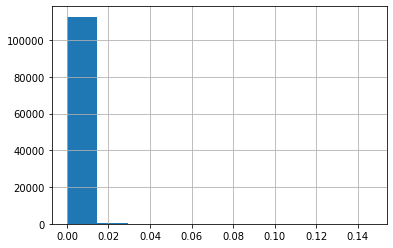

In [66]:
dfa['attention'].hist()
dfa['attention'].describe()

#### Which is very similar to the distribution when removing those zero-vectors..

count    113374.000000
mean          0.001785
std           0.002641
min           0.000073
25%           0.000869
50%           0.001215
75%           0.001835
max           0.146551
Name: attention, dtype: float64

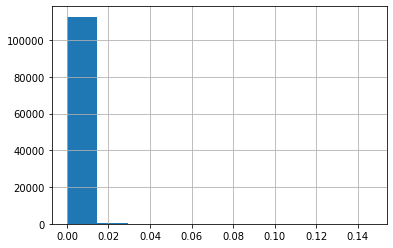

In [67]:
dfa.dropna(subset=['tile_name'])['attention'].hist()
dfa.dropna(subset=['tile_name'])['attention'].describe()

### We can now display the top and bottom tiles of the entire test set:

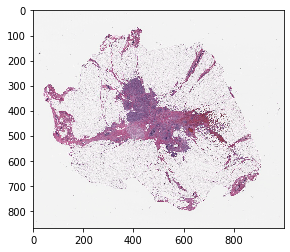

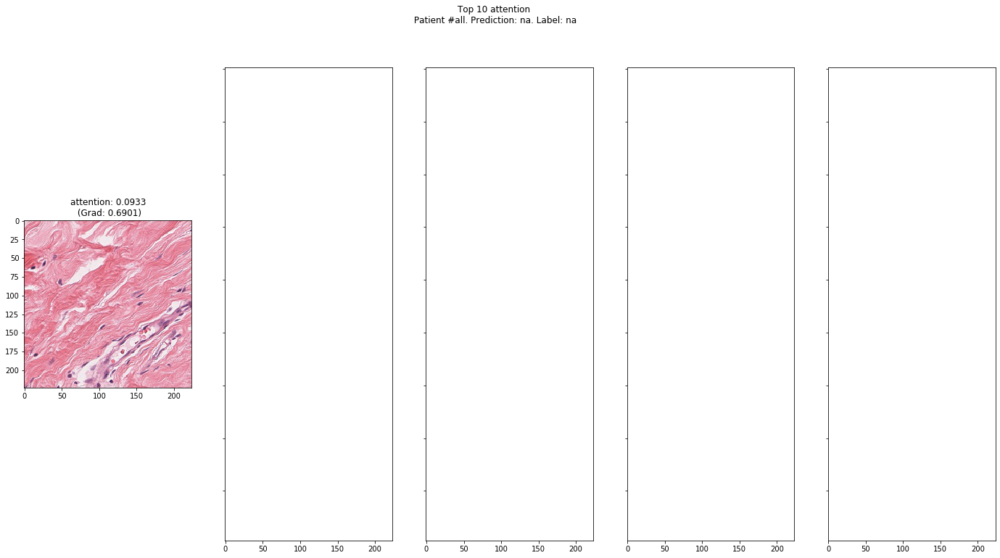

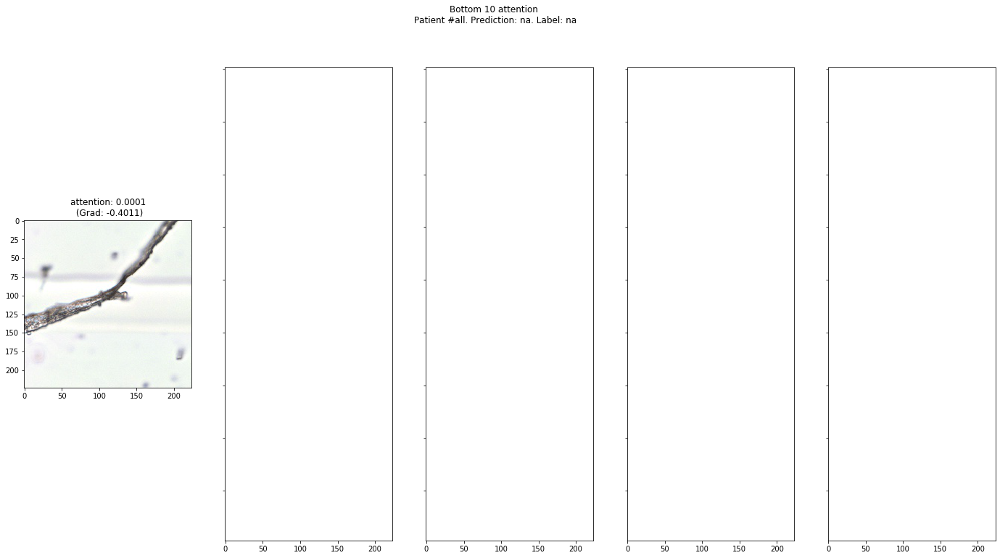

In [68]:
full_viz('all')

## But since these can be from wrong predictions, they might not display it all too well!

Therefore, we will now do the following
1. Sort by HRD Score
2. Take top 10, and bottom 10 HRD Score
3. Sort those by the diff
4. Take the lowest diffs

## 1. Sort by HRD Score

In [69]:
if dataset=="BASIS":
    dfo = dfo.sort_values(by="HRD_norm")
    dfo_top_hrd = dfo.head(10)
    dfo_bottom_hrd= dfo.tail(10)
else:
    dfo = dfo.sort_values(by="diff")
    dfo_top_hrd = dfo[dfo['labels']==1].head(10)
    dfo_bottom_hrd = dfo[dfo['labels']==0].head(10)




## 2. Take top 10 and bottom 10


## 3. Sort by diff and take the lowest diffs

In [70]:

dfo_top_hrd_low_diff = dfo_top_hrd.sort_values(by='diff').head(5)
dfo_bottom_hrd_low_diff = dfo_bottom_hrd.sort_values(by='diff').head(5)


## We can now visualize the best prediction of the top 10 highest HRD Score patients!

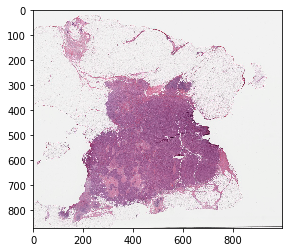

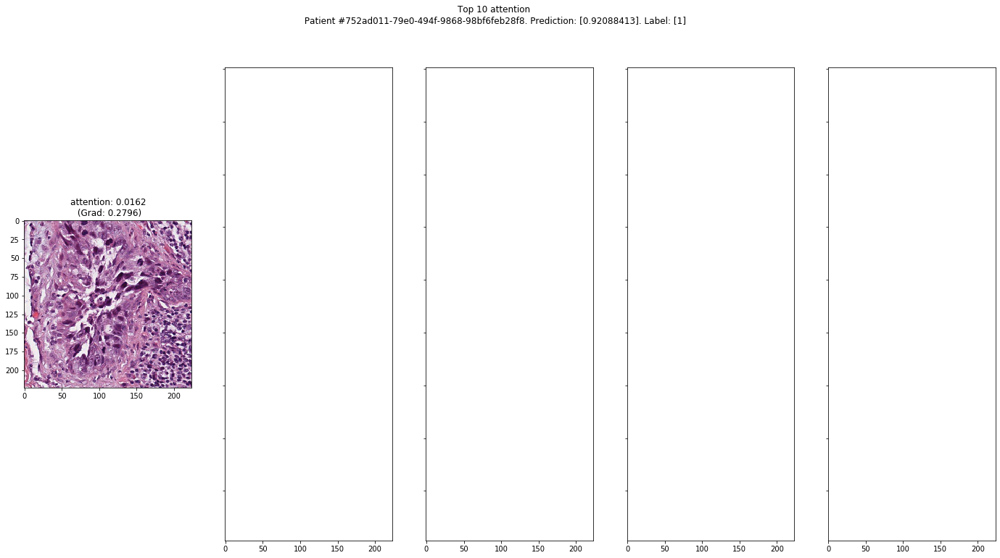

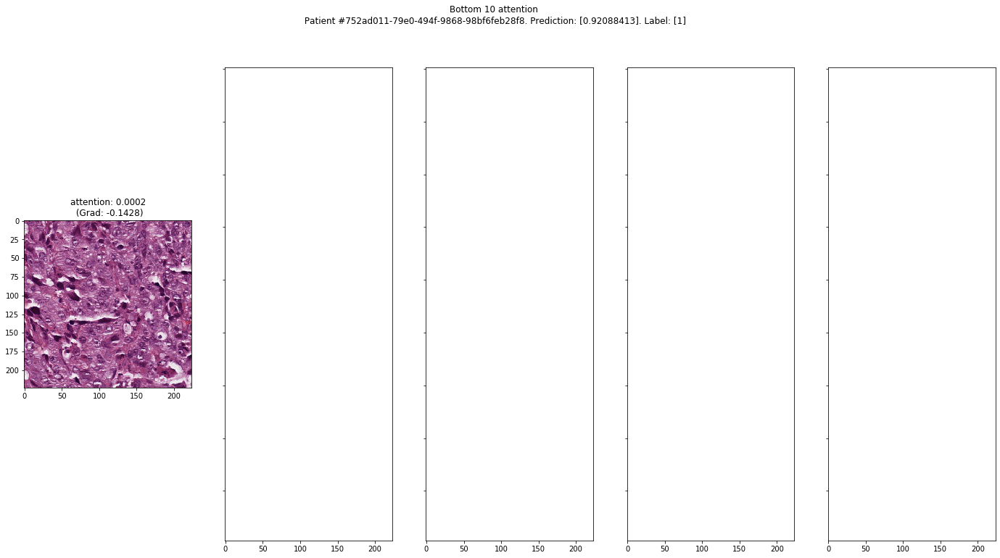

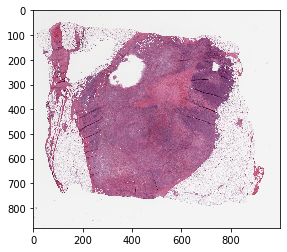

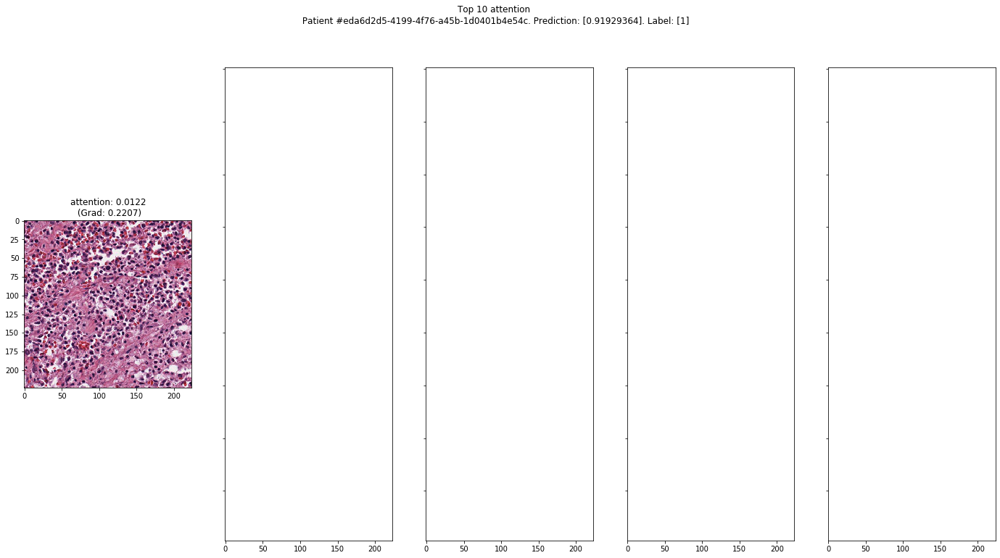

...

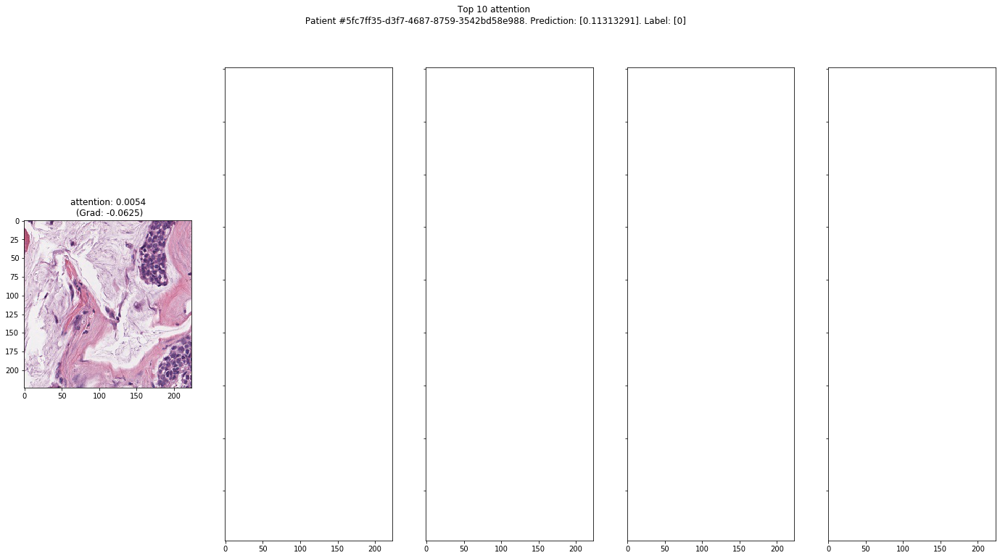

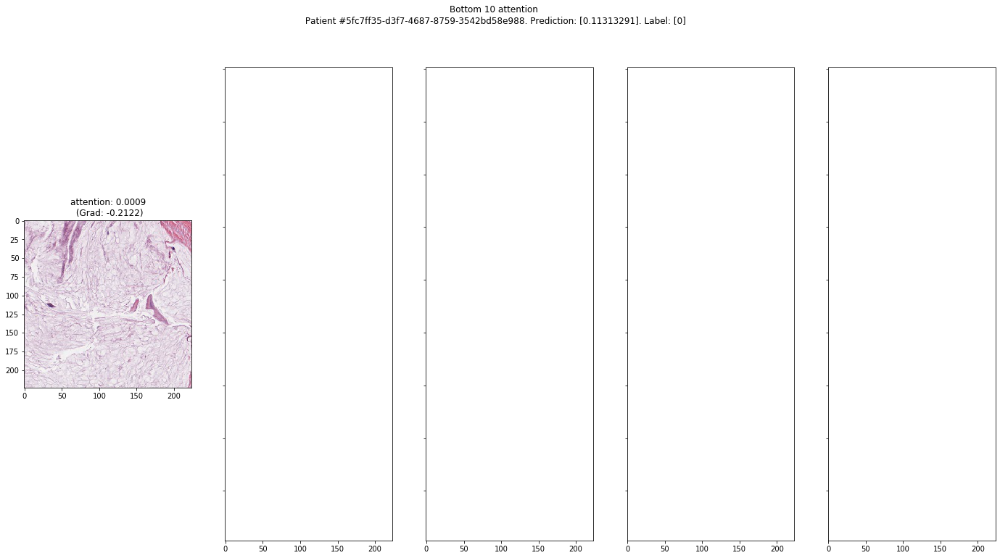

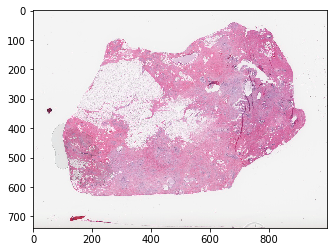

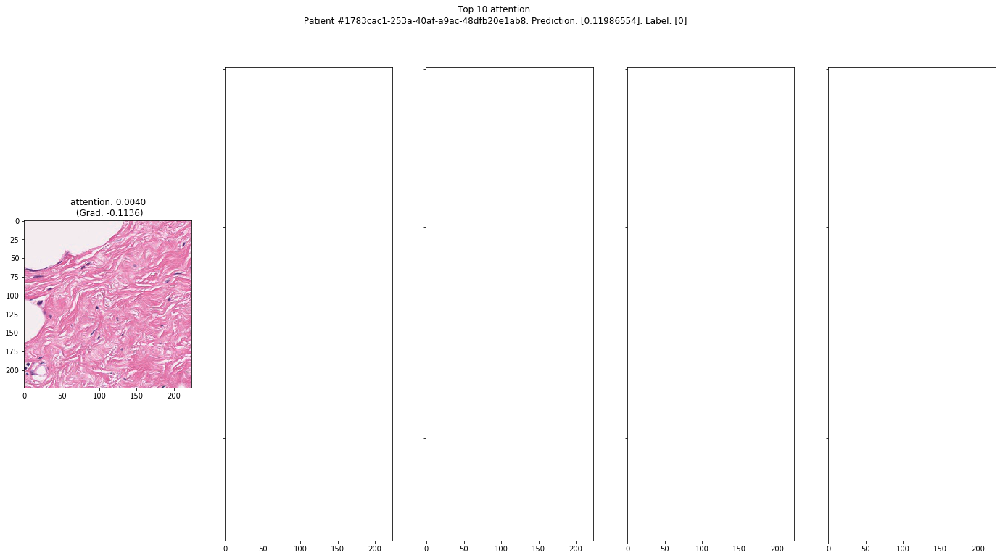

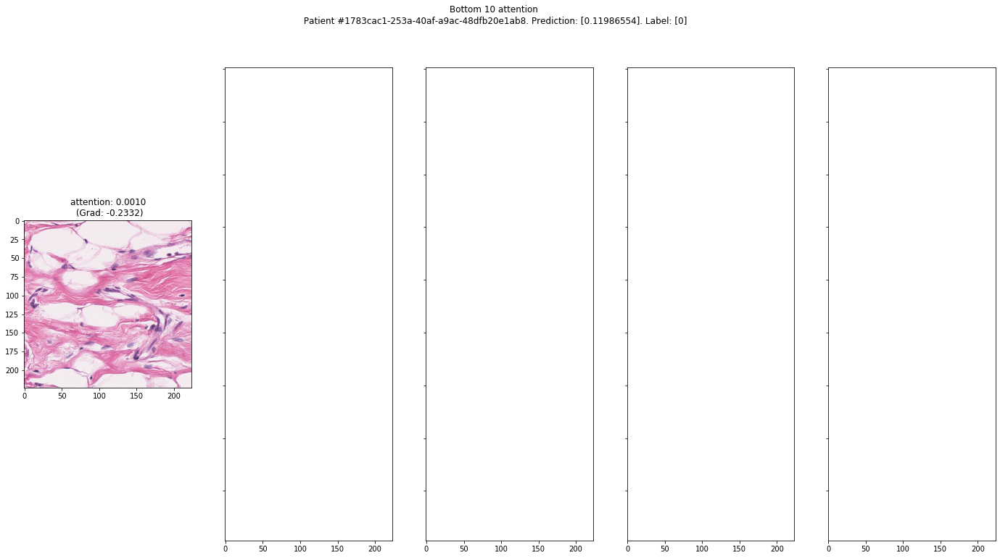

In [71]:
for idx, row in dfo_top_hrd_low_diff.iterrows():
    print("=======================================\n===========================\n")
    full_viz(row['patient'], save_ims=True, save_dir=f"./attention_viz_output/{dataset}/tp53/{row['patient']}-{row['labels']}-{row['preds']}-{row['HRD']}-{row['HRD_norm']}")

for idx, row in dfo_bottom_hrd_low_diff.iterrows():
    print("=======================================\n===========================\n")
    full_viz(row['patient'], save_ims=True, save_dir=f"./attention_viz_output/{dataset}/tp53/{row['patient']}-{row['labels']}-{row['preds']}-{row['HRD']}-{row['HRD_norm']}")
    

## And we can visualize the highest and lowest attention on the best predictions on the lowest HRD Scores :)


HRD             2
preds    0.122316
Name: 11, dtype: object


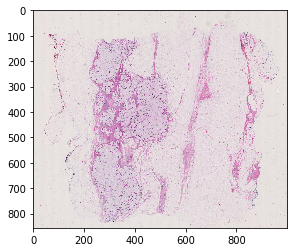

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

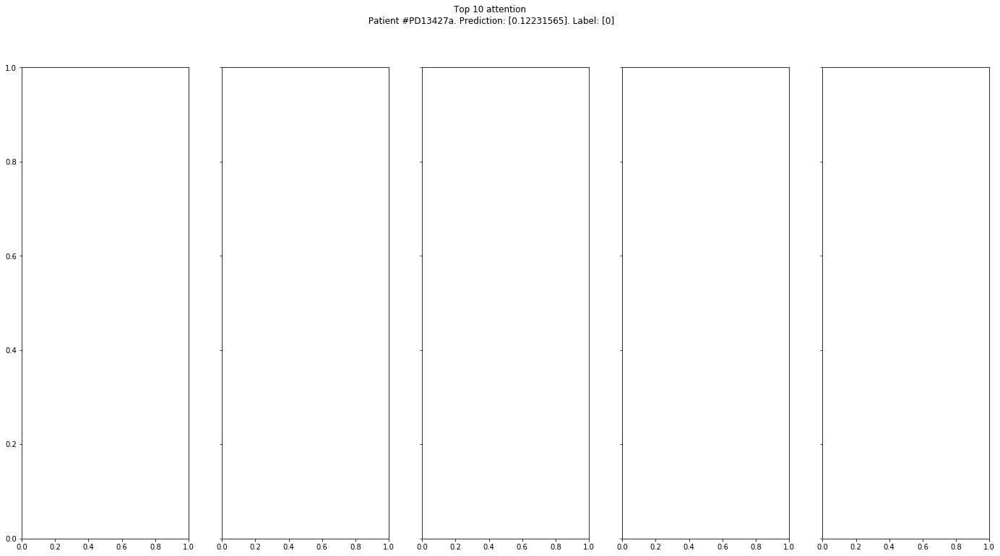

In [109]:
for idx, row in dfo_top_hrd_low_diff.iterrows():
    print("=======================================\n===========================\n")
    print(f"{row[['HRD', 'preds']]}")
    full_viz(row['patient'])

# We can visualize the top 2 positive label patients...

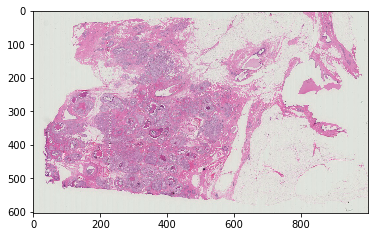

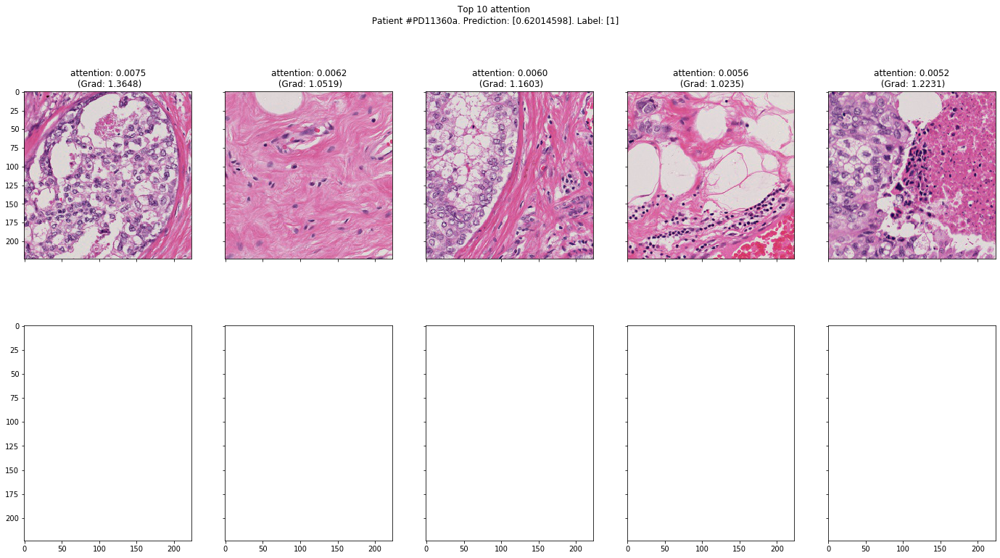

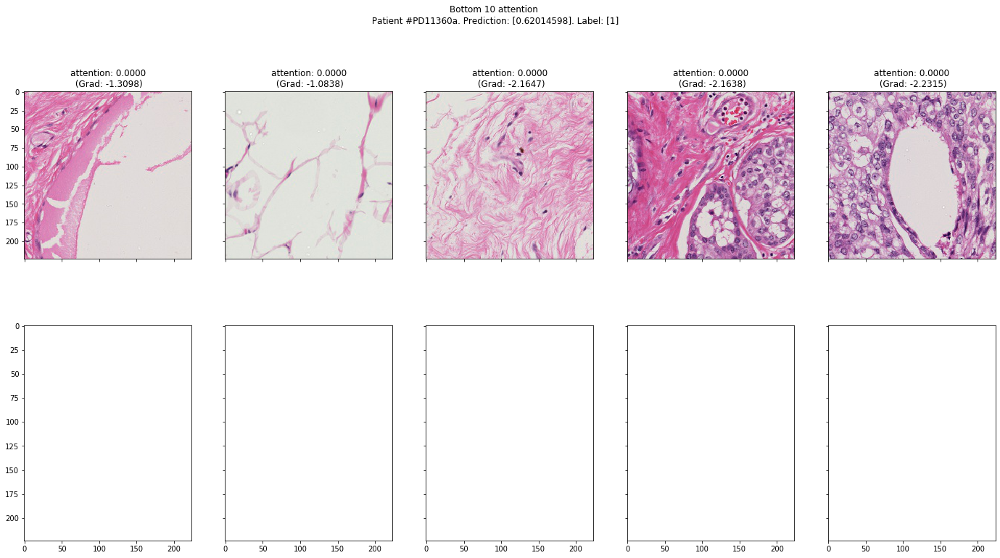

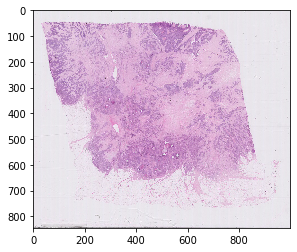

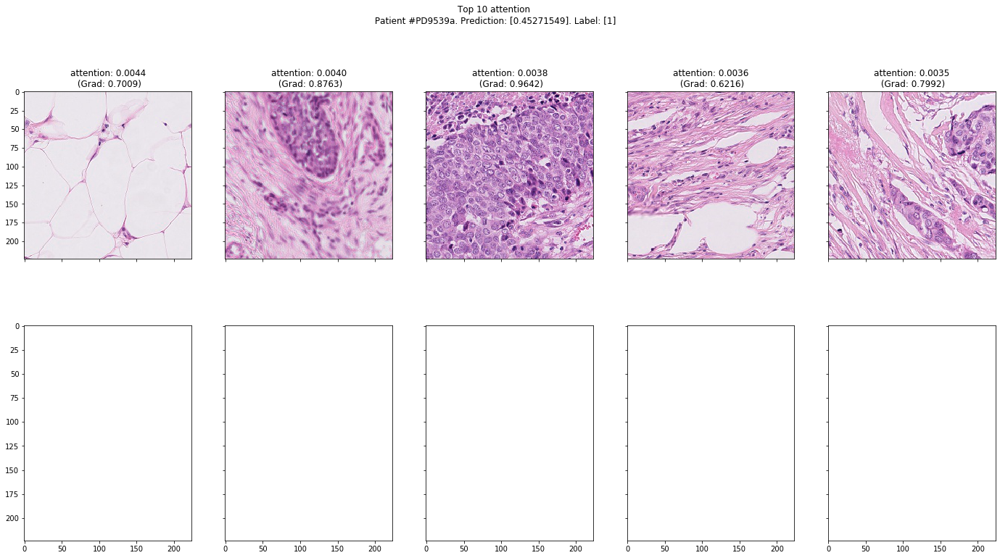

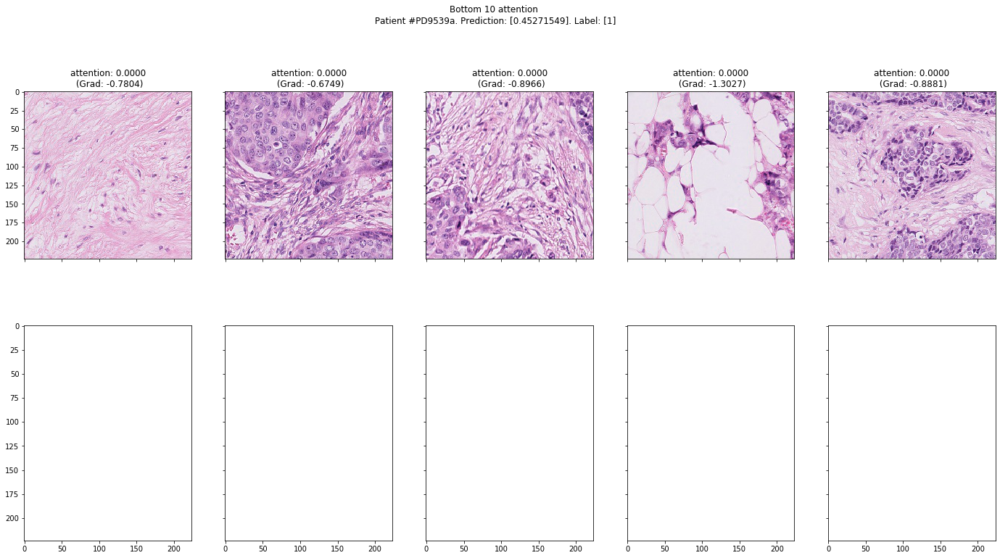

In [96]:
for idx, row in dfo[dfo['labels']==1].head(2).iterrows():
    print("=======================================\n===========================\n")
    full_viz(row['patient'])

## and top 2 negative label patients...

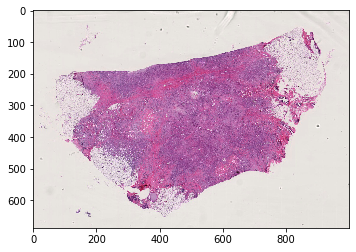

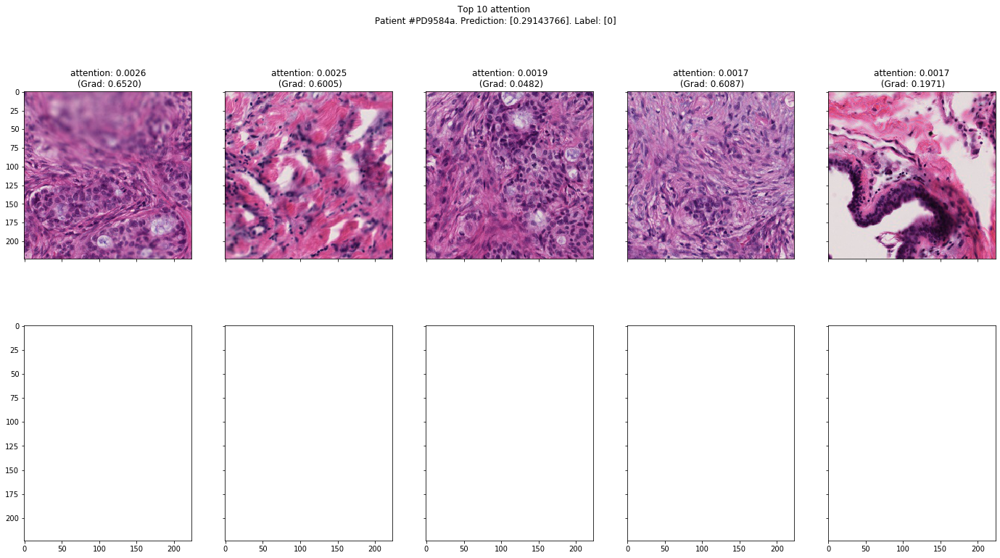

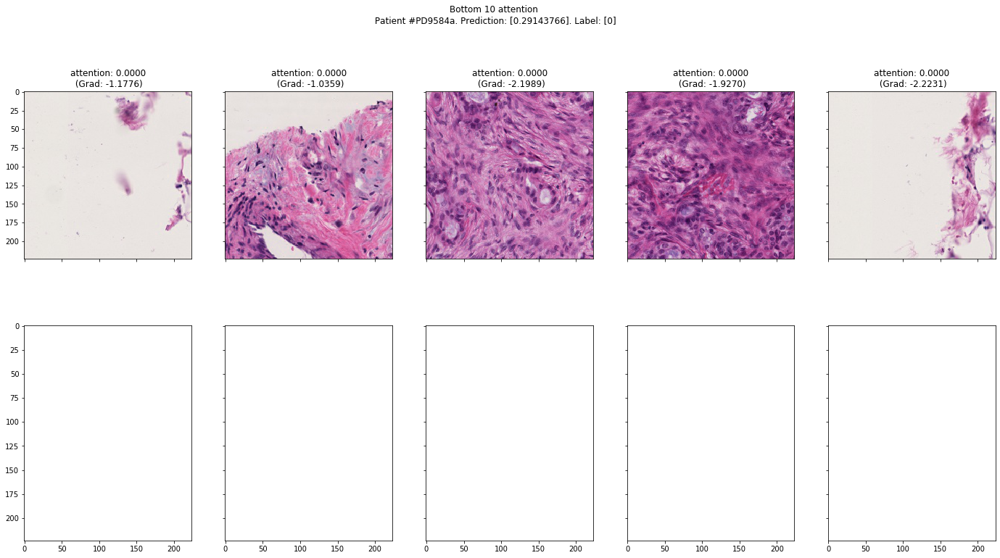

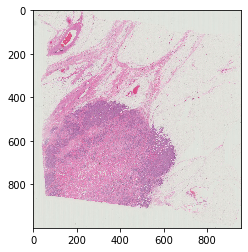

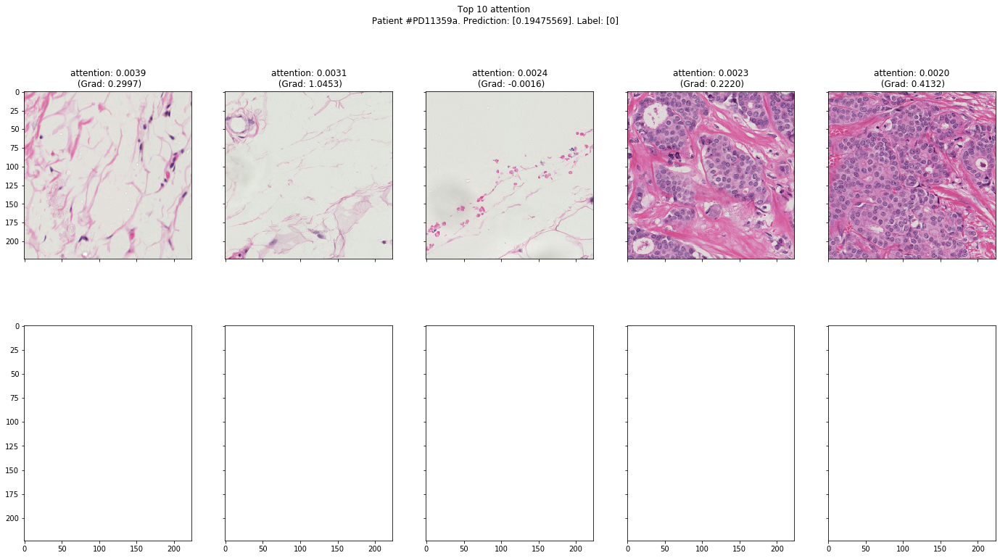

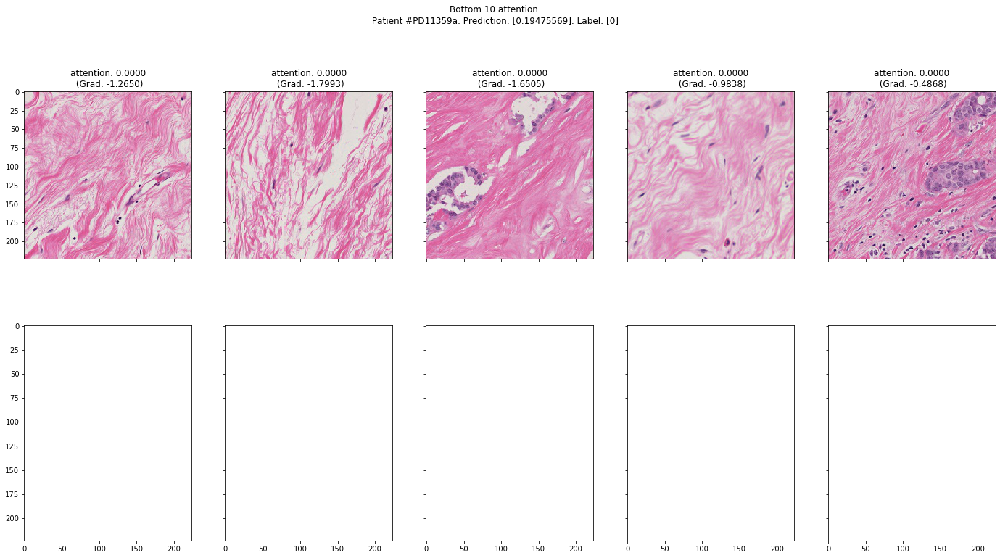

In [97]:
for idx, row in dfo[dfo['labels']==0].head(2).iterrows():
    print("=======================================\n===========================\n")
    full_viz(row['patient'])

## We can visualize the bottom 2 positive label patients...

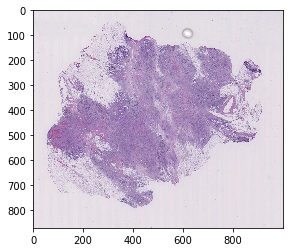

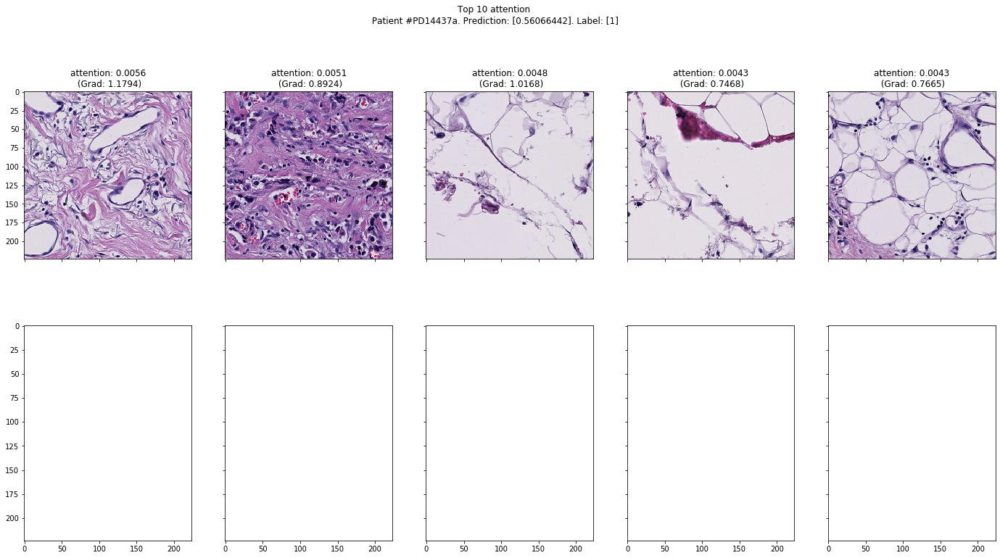

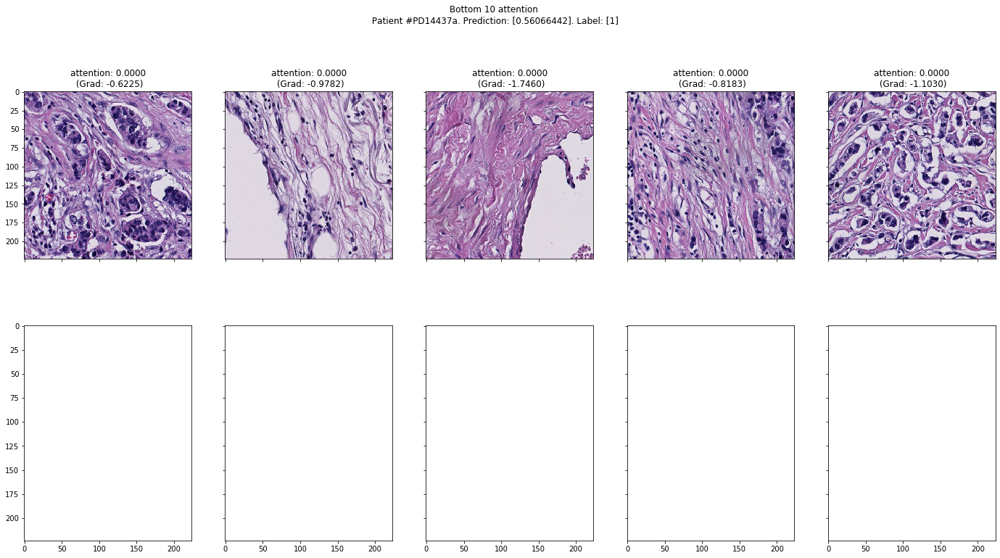

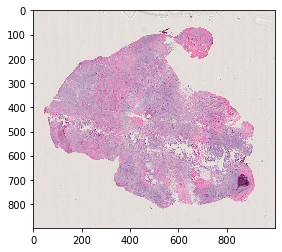

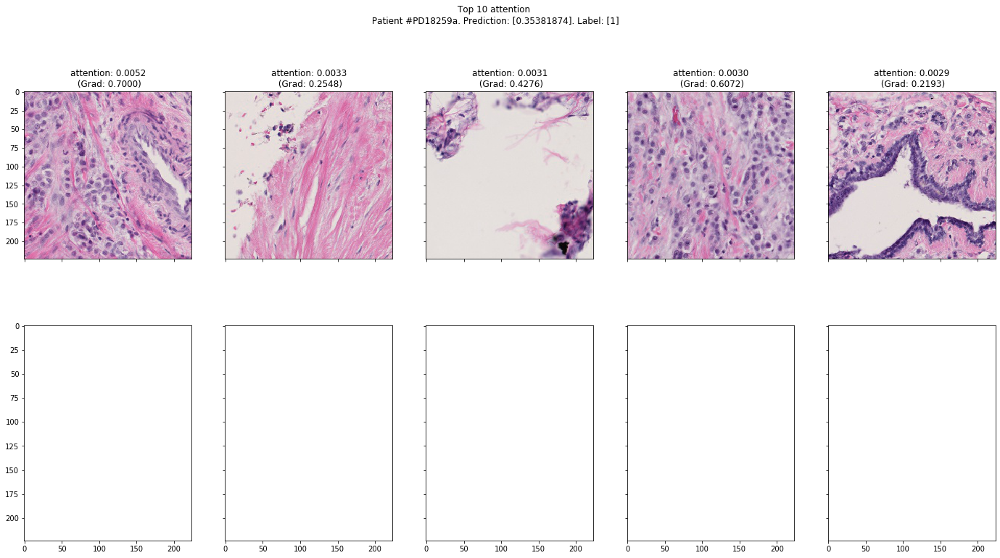

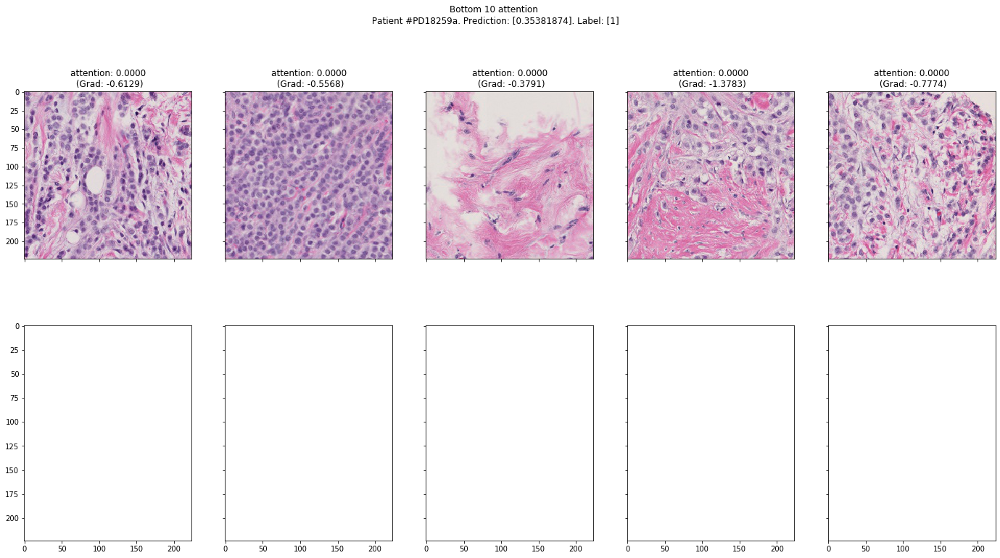

In [98]:
i=0
for idx, row in dfo[dfo['labels']==1].tail(10).iterrows():
    if len(dfo[dfo['patient']==row['patient']]) > 1:
        print(f"Skipping {row['patient']} since there is more than one WSIs, and we cant figure out which is which")
        continue
    else:
        i+=1
    print("=======================================\n===========================\n")
    full_viz(row['patient'])
    if i == 2:
        break

## And the bottom 2 negative label patients...

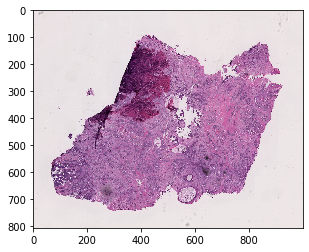

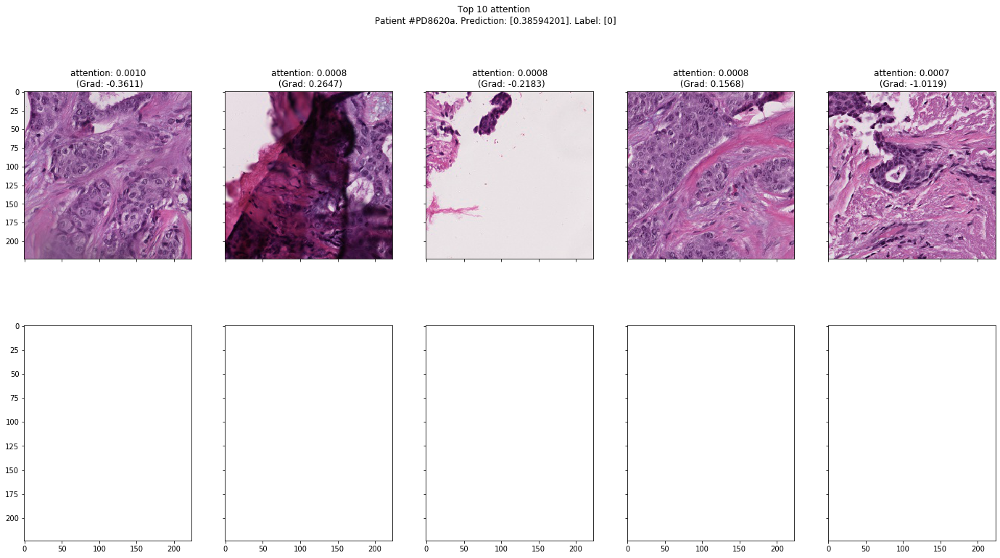

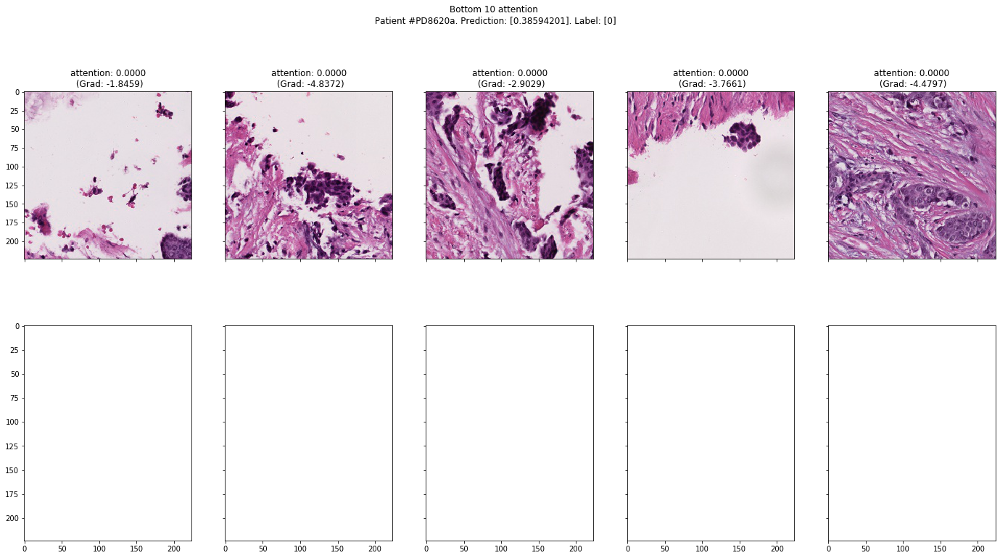

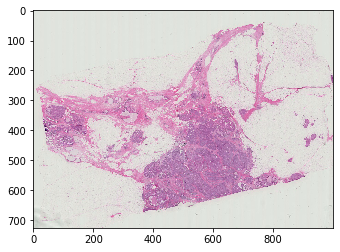

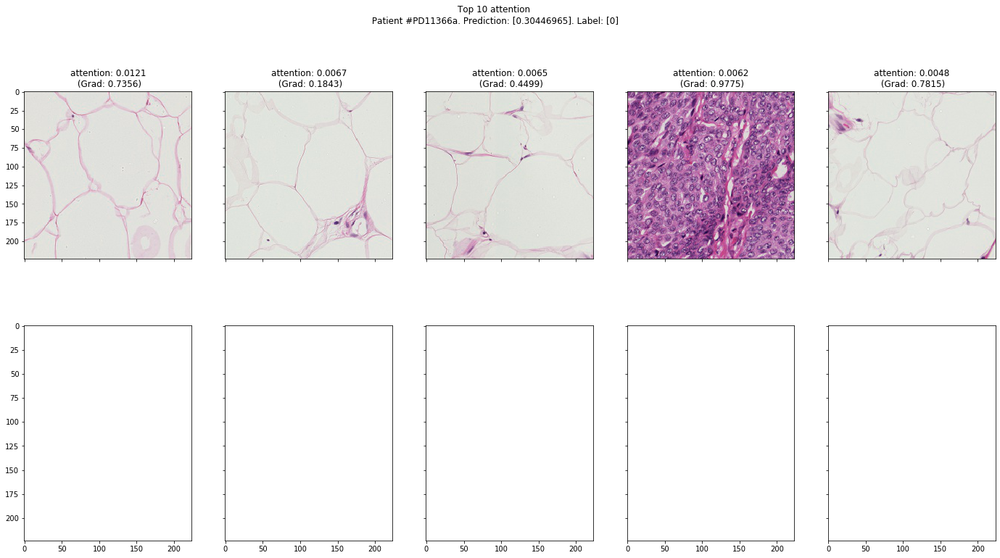

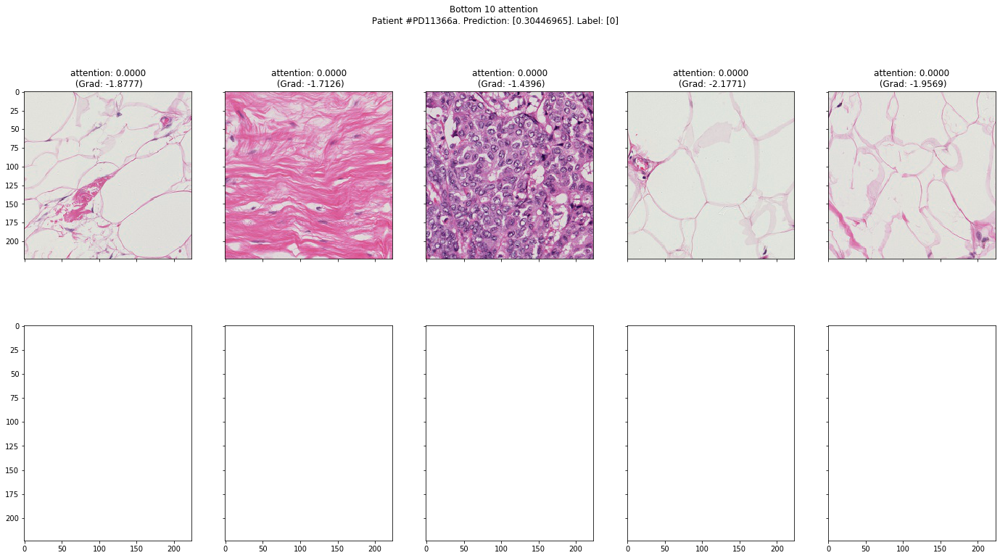

In [99]:
i=0
for idx, row in dfo[dfo['labels']==0].tail(10).iterrows():
    if len(dfo[dfo['patient']==row['patient']]) > 1:
        print(f"Skipping {row['patient']} since there is more than one WSIs, and we cant figure out which is which")
        continue
    else:
        i+=1
    print("=======================================\n===========================\n")
    full_viz(row['patient'])
    if i == 2:
        break